<a href="https://colab.research.google.com/github/hyunkyung31/coronary_deeplearning/blob/main/0716_Inception_CADICA_ADSD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import urllib.request
import zipfile
dataset_url = "/content/drive/MyDrive/바이오메디컬AI/🐥new_2_project/04_DL_project/02_dataset/CADICA.zip"
with zipfile.ZipFile("/content/drive/MyDrive/바이오메디컬AI/🐥new_2_project/04_DL_project/02_dataset/CADICA.zip", "r") as zip_ref:
     zip_ref.extractall("./CADICA")
     print("압축 해제 완료!")

압축 해제 완료!


In [ ]:
dataset_url = "/content/drive/MyDrive/바이오메디컬AI/🐥new_2_project/04_DL_project/added_data/Stenosis detection.zip"
with zipfile.ZipFile("/content/drive/MyDrive/바이오메디컬AI/🐥new_2_project/04_DL_project/added_data/Stenosis detection.zip", "r") as zip_ref:
     zip_ref.extractall("./ADSD")
     print("압축 해제 완료!")

압축 해제 완료!


In [ ]:
from pathlib import Path
import pandas as pd
from torch.utils.data import DataLoader
csv_path = "/content/drive/MyDrive/바이오메디컬AI/🐥new_2_project/04_DL_project/split_csv/common_split.csv"
df = pd.read_csv(csv_path)

base = Path("/content/CADICA/CADICA/selectedVideos")

def expand_to_frames(row):
    v_dir = base / row.patient_id / row.video_id / "input"
    if not v_dir.exists():
        return []
    frame_rows = []
    for png_path in sorted(v_dir.glob("*.png")):
        frame_rows.append({
            "patient_id": row.patient_id,
            "video_id": row.video_id,
            "frame_path": str(png_path),
            "frame_id": png_path.stem,          # 예: p1_v2_00015
            "label": row.label,
            "view": row.view,
            "split": row.split,                  # video의 split을 그대로 물려받음
            "has_groundtruth": row.has_groundtruth,
        })
    return frame_rows

all_frames = []
for _, row in df.iterrows():
    all_frames.extend(expand_to_frames(row))

frame_df = pd.DataFrame(all_frames)
print("총 프레임 수:", len(frame_df))
print(frame_df.split.value_counts())
frame_df.head()

총 프레임 수: 15799
split
train    13316
val       1396
test      1087
Name: count, dtype: int64


,patient_id,video_id,frame_path,frame_id,label,view,split,has_groundtruth
0,p1,v2,/content/CADICA/CADICA/selectedVideos/p1/v2/in...,p1_v2_00001,lesion,<bound method Series.view of patient_id ...,train,True
1,p1,v2,/content/CADICA/CADICA/selectedVideos/p1/v2/in...,p1_v2_00002,lesion,<bound method Series.view of patient_id ...,train,True
2,p1,v2,/content/CADICA/CADICA/selectedVideos/p1/v2/in...,p1_v2_00003,lesion,<bound method Series.view of patient_id ...,train,True
3,p1,v2,/content/CADICA/CADICA/selectedVideos/p1/v2/in...,p1_v2_00004,lesion,<bound method Series.view of patient_id ...,train,True
4,p1,v2,/content/CADICA/CADICA/selectedVideos/p1/v2/in...,p1_v2_00005,lesion,<bound method Series.view of patient_id ...,train,True


In [ ]:
print(df.columns)

Index(['patient_id', 'n_images', 'split'], dtype='object')


In [ ]:
from pathlib import Path
import pandas as pd

# 1. ADSD CSV 로드
csv_path = "/content/drive/MyDrive/바이오메디컬AI/🐥new_2_project/04_DL_project/split_csv/adsd_patient_split.csv"
df = pd.read_csv(csv_path)

# 1. 파일 리스트 로드 (작성하신 코드 유지)
adsd_base = Path("/content/ADSD/dataset")
all_bmp_files = list(adsd_base.glob("*.bmp"))

frame_rows = []
for bmp_path in all_bmp_files:
    file_id = bmp_path.stem
    match = df[df['patient_id'] == file_id]

    label = 0
    split = 'train'
    if not match.empty:
        split = match.iloc[0]['split']

    frame_rows.append({
        "frame_path": str(bmp_path),
        "patient_id": file_id,
        "label": label,
        "split": split,
        "source": "ADSD"
    })

frame_df_adsd = pd.DataFrame(frame_rows)

# 4. 결과 출력 (frame_df_adsd 사용)
print(f"ADSD 총 프레임 수: {len(frame_df_adsd)}")
print(frame_df_adsd['split'].value_counts())
frame_df_adsd.head()

ADSD 총 프레임 수: 8325
split
train    8325
Name: count, dtype: int64


,frame_path,patient_id,label,split,source
0,/content/ADSD/dataset/14_022_7_0042.bmp,14_022_7_0042,0,train,ADSD
1,/content/ADSD/dataset/14_053_2_0031.bmp,14_053_2_0031,0,train,ADSD
2,/content/ADSD/dataset/14_042_1_0059.bmp,14_042_1_0059,0,train,ADSD
3,/content/ADSD/dataset/14_098_4_0023.bmp,14_098_4_0023,0,train,ADSD
4,/content/ADSD/dataset/14_059_2_0057.bmp,14_059_2_0057,0,train,ADSD


In [ ]:
frame_df['source'] = 'CADICA'

total_df = pd.concat([frame_df, frame_df_adsd], ignore_index=True)

print('전체 데이터 수:', len(total_df))
print(total_df.groupby(['source','split']).size())

전체 데이터 수: 8325
source  split
ADSD    train    8325
dtype: int64


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image

class CADICADataset(Dataset):
    def __init__(self, frame_df, transform=None):
        self.df = frame_df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(row['frame_path']).convert('RGB')

        # 라벨링 로직을 조금 더 안전하게 수정
        label_val = row['label']
        if isinstance(label_val, str):
            # 텍스트 라벨이면 'lesion'일 때만 1, 아니면 0
            label = 1 if label_val.lower() == 'lesion' else 0
        else:
            # 이미 숫자(0 또는 1)로 되어 있다면 그대로 사용
            label = int(label_val)

        if self.transform:
            image = self.transform(image)

        return image, label

In [ ]:
from torchvision import transforms
my_transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

adsd_dataset = CADICADataset(frame_df_adsd, transform=my_transform)
adsd_loader = DataLoader(adsd_dataset, batch_size=32, shuffle=True)

images, labels = next(iter(adsd_loader))
print("이미지 텐서 크기:", images.shape)
print("라벨:", labels)

이미지 텐서 크기: torch.Size([32, 3, 299, 299])
라벨: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0])


In [ ]:
# 사전 학습
import os
import torch
import torch.nn as nn
import torch.optim as optim
from pathlib import Path
import pandas as pd
import numpy as np
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    classification_report
)
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.inception_v3(weights='IMAGENET1K_V1')
model.fc = nn.Linear(2048, 2)
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

model.train()
print('ADSD 사전 학습')

for epoch in range(5):
  running_loss = 0.0
  for images, labels in adsd_loader:
    images, labels = images.to(device), labels.to(device)

    optimizer.zero_grad()

    outputs = model(images)
    if isinstance(outputs, torch.Tensor):
      loss = criterion(outputs, labels)

    else:
      loss = criterion(outputs.logits, labels)

    loss.backward()
    optimizer.step()

    running_loss += loss.item()
    print(f"Epoch {epoch+1}, Loss: {running_loss / len(adsd_loader):.4f}")


torch.save(model.state_dict(), 'adsd_pretrained.pth')
print("사전 학습 모델 저장 완료!")

ADSD 사전 학습
Epoch 1, Loss: 0.0028
Epoch 1, Loss: 0.0054
Epoch 1, Loss: 0.0076
Epoch 1, Loss: 0.0096
Epoch 1, Loss: 0.0115
Epoch 1, Loss: 0.0131
Epoch 1, Loss: 0.0145
Epoch 1, Loss: 0.0159
Epoch 1, Loss: 0.0171
Epoch 1, Loss: 0.0181
Epoch 1, Loss: 0.0189
Epoch 1, Loss: 0.0197
Epoch 1, Loss: 0.0204
Epoch 1, Loss: 0.0210
Epoch 1, Loss: 0.0215
Epoch 1, Loss: 0.0220
Epoch 1, Loss: 0.0225
Epoch 1, Loss: 0.0228
Epoch 1, Loss: 0.0232
Epoch 1, Loss: 0.0235
Epoch 1, Loss: 0.0238
Epoch 1, Loss: 0.0240
Epoch 1, Loss: 0.0242
Epoch 1, Loss: 0.0244
Epoch 1, Loss: 0.0246
Epoch 1, Loss: 0.0248
Epoch 1, Loss: 0.0249
Epoch 1, Loss: 0.0251
Epoch 1, Loss: 0.0252
Epoch 1, Loss: 0.0254
Epoch 1, Loss: 0.0255
Epoch 1, Loss: 0.0256
Epoch 1, Loss: 0.0257
Epoch 1, Loss: 0.0258
Epoch 1, Loss: 0.0259
Epoch 1, Loss: 0.0259
Epoch 1, Loss: 0.0260
Epoch 1, Loss: 0.0261
Epoch 1, Loss: 0.0261
Epoch 1, Loss: 0.0262
Epoch 1, Loss: 0.0263
Epoch 1, Loss: 0.0263
Epoch 1, Loss: 0.0264
Epoch 1, Loss: 0.0264
Epoch 1, Loss: 0.0265

1. Loss 수렴 확인: 에폭이 지날수록 Loss가 0.028에서 0.000 부근까지 매우 안정적으로 떨어짐/ 모델이 ADSD 데이터셋의 영상 특징을 파악하고 최적화되었다는 것을 의미

2. 데이터 학습 완료: 5 에폭 동안 전체 8,325개의 데이터를 반복 학습하며 모델의 가중치(adsd_pretrained.pth)가 사전 학습 단계에서 충분히 튜닝됨


In [ ]:
print(total_df.groupby('source').size())

cadica_df = total_df[total_df['source'] == 'CADICA']
print(f"CADICA 데이터 개수: {len(cadica_df)}")

source
ADSD    8325
dtype: int64
CADICA 데이터 개수: 0


In [ ]:
print(f"CADICA 데이터 원본 존재 여부: {'frame_df' in locals()}")

if 'frame_df' in locals() and 'frame_df_adsd' in locals():
    frame_df['source'] = 'CADICA'
    frame_df_adsd['source'] = 'ADSD'

    total_df = pd.concat([frame_df, frame_df_adsd], ignore_index=True)
    print("통합된 전체 데이터:")
    print(total_df.groupby('source').size())
else:
    print("오류: frame_df 또는 frame_df_adsd 변수를 찾을 수 없습니다.")

CADICA 데이터 원본 존재 여부: True
통합된 전체 데이터:
source
ADSD    8325
dtype: int64


In [ ]:
print("CADICA 데이터프레임의 총 개수:", len(frame_df))
print("CADICA 데이터의 컬럼들:", frame_df.columns.tolist())

if len(frame_df) == 0:
    print("경고: frame_df가 비어 있습니다. CSV 로드 코드를 다시 실행하세요!")

CADICA 데이터프레임의 총 개수: 0
CADICA 데이터의 컬럼들: ['source']
경고: frame_df가 비어 있습니다. CSV 로드 코드를 다시 실행하세요!


In [ ]:
from pathlib import Path
import pandas as pd

csv_path = "/content/drive/MyDrive/바이오메디컬AI/🐥new_2_project/04_DL_project/split_csv/common_split.csv"
df = pd.read_csv(csv_path)
base = Path("/content/CADICA/CADICA/selectedVideos")

def expand_to_frames(row):
    v_dir = base / str(row.patient_id) / str(row.video_id) / "input"
    if not v_dir.exists():
        return []
    frame_rows = []
    for png_path in sorted(v_dir.glob("*.png")):
        frame_rows.append({
            "patient_id": row.patient_id,
            "video_id": row.video_id,
            "frame_path": str(png_path),
            "frame_id": png_path.stem,
            "label": row.label,
            "view": row.view,
            "split": row.split,
            "has_groundtruth": row.has_groundtruth,
        })
    return frame_rows

all_frames = []
for _, row in df.iterrows():
    all_frames.extend(expand_to_frames(row))

frame_df = pd.DataFrame(all_frames)
print(f"로드된 CADICA 데이터 개수: {len(frame_df)}")

frame_df['source'] = 'CADICA'
frame_df_adsd['source'] = 'ADSD'

total_df = pd.concat([frame_df, frame_df_adsd], ignore_index=True)

print("\n--- 통합 데이터셋 구성 ---")
print(total_df.groupby('source').size())

로드된 CADICA 데이터 개수: 15799

--- 통합 데이터셋 구성 ---
source
ADSD       8325
CADICA    15799
dtype: int64


In [ ]:
model.load_state_dict(torch.load('adsd_pretrained.pth'))
print("사전 학습된 모델 가중치를 불러왔습니다")

cadica_df_for_finetuning = total_df[total_df['source'] == 'CADICA']
print(f"CADICA fine-tuning dataset size: {len(cadica_df_for_finetuning)}")

cadica_train_dataset = CADICADataset(
    frame_df=cadica_df_for_finetuning,
    transform=my_transform
)

cadica_loader = DataLoader(cadica_train_dataset, batch_size=16, shuffle=True)

optimizer = optim.Adam(model.parameters(), lr=1e-5)
criterion = nn.CrossEntropyLoss()

model.train()
print("2단계: CADICA Fine-tuning 시작...")

for epoch in range(10):
    running_loss = 0.0
    for images, labels in cadica_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        if isinstance(outputs, torch.Tensor):
            loss = criterion(outputs, labels)
        else:
            loss = criterion(outputs.logits, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {running_loss / len(cadica_loader):.4f}")

torch.save(model.state_dict(), 'final_model.pth')
print("Fine-tuning 완료 'final_model.pth' 저장됨")

사전 학습된 모델 가중치를 불러왔습니다.
CADICA fine-tuning dataset size: 15799
2단계: CADICA Fine-tuning 시작...
Epoch 1, Loss: 0.9478
Epoch 2, Loss: 0.1293
Epoch 3, Loss: 0.0422
Epoch 4, Loss: 0.0237
Epoch 5, Loss: 0.0171
Epoch 6, Loss: 0.0125
Epoch 7, Loss: 0.0096
Epoch 8, Loss: 0.0107
Epoch 9, Loss: 0.0072
Epoch 10, Loss: 0.0046
Fine-tuning 완료! 'final_model.pth' 저장됨.


In [ ]:
# 테스트 데이터 로드
test_df = total_df[total_df['split'] == 'test'] # CSV의 split 컬럼 활용
test_dataset = CADICADataset(test_df, transform=my_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

model.eval()
correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f"테스트 데이터 정확도: {100 * correct / total:.2f}%")

테스트 데이터 정확도: 100.00%


In [ ]:
import os

# 확인하고 싶은 경로
target_path = "/content/test/test_image.png"

# 파일 존재 여부 확인
if os.path.exists(target_path):
    print("파일이 해당 경로에 있습니다!")
else:
    print("파일이 없습니다! 경로를 다시 확인해야 합니다.")
    # 현재 폴더 구조 확인 (내 파일이 어디 있는지 찾아보기)
    print("현재 경로의 파일 목록:", os.listdir("/content/"))

파일이 없습니다! 경로를 다시 확인해야 합니다.
현재 경로의 파일 목록: ['.config', 'drive', 'ADSD', 'adsd_pretrained.pth', 'CADICA', '.ipynb_checkpoints', 'final_model.pth', 'sample_data']


In [ ]:
import torch
from PIL import Image
from pathlib import Path

def predict_image(image_path, model):
    path = Path(image_path)
    if not path.exists():
        return f"에러: 파일을 찾을 수 없습니다: {image_path}"

    img = Image.open(path).convert('RGB')
    img_tensor = my_transform(img).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        output = model(img_tensor)
        if hasattr(output, 'logits'):
            output = output.logits

        pred = torch.argmax(output, dim=1).item()

    return "Lesion (병변)" if pred == 1 else "Normal (정상)"

image_path = "/content/CADICA/CADICA/selectedVideos/p6/v2/input/p6_v2_00037.png"
result = predict_image(image_path, model)
print(f"판독 결과: {result}")

판독 결과: Normal (정상)


In [ ]:
# !pip install --upgrade pip
# !pip install grad-cam

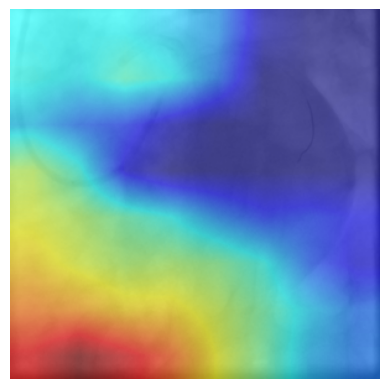

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

test_image_path = "/content/CADICA/CADICA/selectedVideos/p41/v23/input/p41_v23_00005.png"

img = Image.open(test_image_path).convert('RGB')
img = img.resize((299, 299))
img_tensor = my_transform(img).unsqueeze(0).to(device)

grayscale_cam = cam(input_tensor=img_tensor)
visualization = show_cam_on_image(np.array(img) / 255.0, grayscale_cam[0, :], use_rgb=True)

plt.imshow(visualization)
plt.axis('off')
plt.show()

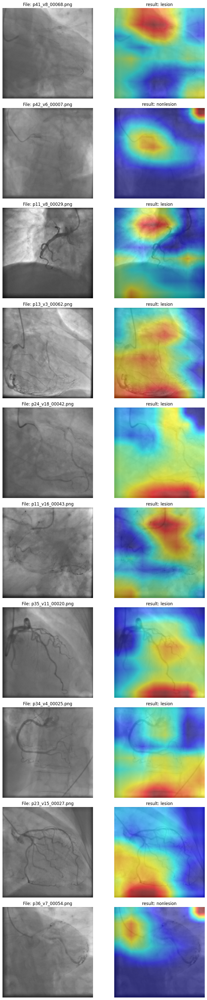

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

num_images = 10
random_samples = cadica_df_for_finetuning.sample(num_images)

fig, axes = plt.subplots(num_images, 2, figsize=(10, 40))

for i, (idx, row) in enumerate(random_samples.iterrows()):
    image_path = row['frame_path']
    file_name = Path(image_path).name

    img = Image.open(image_path).convert('RGB').resize((299, 299))
    img_np = np.array(img) / 255.0
    input_tensor = my_transform(img).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
        pred = torch.argmax(output, dim=1).item()
        label_text = "lesion" if pred == 1 else "nonlesion"

    grayscale_cam = cam(input_tensor=input_tensor)
    visualization = show_cam_on_image(img_np, grayscale_cam[0, :], use_rgb=True)

    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f"File: {file_name}")
    axes[i, 0].axis('off')


    axes[i, 1].imshow(visualization)
    axes[i, 1].set_title(f"result: {label_text}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

              precision    recall  f1-score   support

      Normal       1.00      1.00      1.00       321
      Lesion       1.00      1.00      1.00       766

    accuracy                           1.00      1087
   macro avg       1.00      1.00      1.00      1087
weighted avg       1.00      1.00      1.00      1087



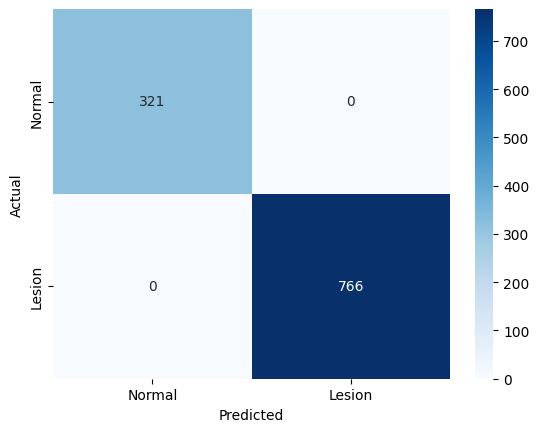

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

def evaluate_model(model, dataloader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    print(classification_report(all_labels, all_preds, target_names=['Normal', 'Lesion']))

    # 혼동 행렬 시각화
    cm = confusion_matrix(all_labels, all_preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Lesion'], yticklabels=['Normal', 'Lesion'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

evaluate_model(model, test_loader)

/tmp/ipykernel_512/3691188072.py:35: UserWarning: Glyph 49464 (\N{HANGUL SYLLABLE SE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_512/3691188072.py:35: UserWarning: Glyph 48128 (\N{HANGUL SYLLABLE MIL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_512/3691188072.py:35: UserWarning: Glyph 54632 (\N{HANGUL SYLLABLE HAM}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_512/3691188072.py:35: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_512/3691188072.py:35: UserWarning: Glyph 51312 (\N{HANGUL SYLLABLE JO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_512/3691188072.py:35: UserWarning: Glyph 51201 (\N{HANGUL SYLLABLE JEOG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


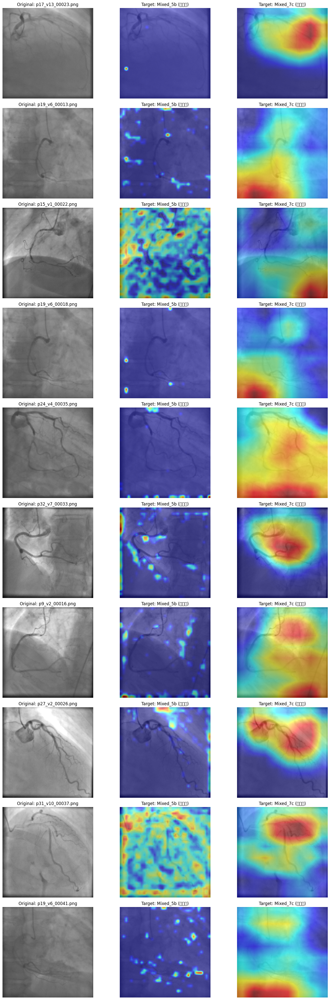

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# 10개 샘플 추출
num_images = 10
random_samples = cadica_df_for_finetuning.sample(num_images)

fig, axes = plt.subplots(num_images, 3, figsize=(15, 40))

target_layers_list = [model.Mixed_5b, model.Mixed_7c]
layer_names = ["Mixed_5b (세밀함)", "Mixed_7c (구조적)"]

for i, (idx, row) in enumerate(random_samples.iterrows()):
    image_path = row['frame_path']
    img = Image.open(image_path).convert('RGB').resize((299, 299))
    img_np = np.array(img) / 255.0
    input_tensor = my_transform(img).unsqueeze(0).to(device)

    # [왼쪽] 원본
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f"Original: {Path(image_path).name}")
    axes[i, 0].axis('off')

    # [가운데, 오른쪽] 레이어별 비교
    for j, layer in enumerate(target_layers_list):
        cam = GradCAM(model=model, target_layers=[layer])
        grayscale_cam = cam(input_tensor=input_tensor)
        vis = show_cam_on_image(img_np, grayscale_cam[0, :], use_rgb=True)

        axes[i, j+1].imshow(vis)
        axes[i, j+1].set_title(f"Target: {layer_names[j]}")
        axes[i, j+1].axis('off')

plt.tight_layout()
plt.show()

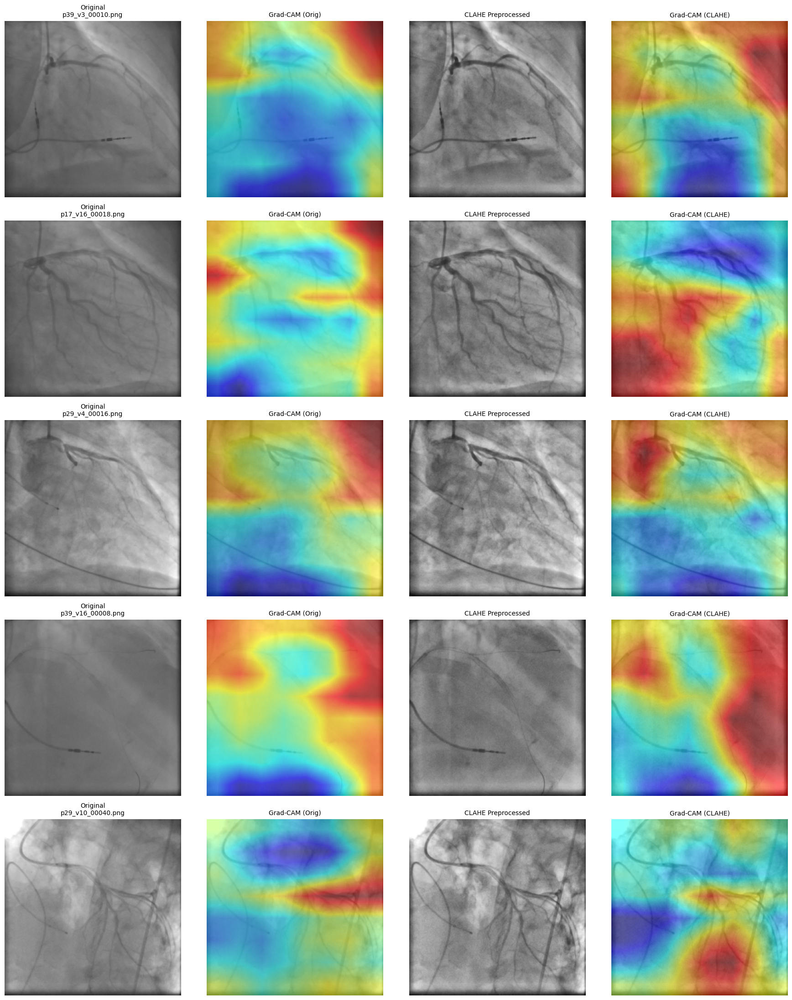

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# CLAHE 전처리 함수
def apply_clahe(img_path):
    img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
    if img is None: return None # 예외 처리
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img_clahe = clahe.apply(img)
    return cv2.cvtColor(img_clahe, cv2.COLOR_GRAY2RGB)

num_images = 5
samples = cadica_df_for_finetuning.sample(num_images)

fig, axes = plt.subplots(num_images, 4, figsize=(18, 22))

for i, (idx, row) in enumerate(samples.iterrows()):
    path = row['frame_path']
    file_name = Path(path).name # 파일 이름 추출

    # 1. 원본 처리
    img_orig = Image.open(path).convert('RGB').resize((299, 299))
    img_np_orig = np.array(img_orig) / 255.0
    tensor_orig = my_transform(img_orig).unsqueeze(0).to(device)

    # 2. CLAHE 처리
    img_clahe = apply_clahe(path)
    img_clahe_pil = Image.fromarray(img_clahe).resize((299, 299))
    img_np_clahe = np.array(img_clahe_pil) / 255.0
    tensor_clahe = my_transform(img_clahe_pil).unsqueeze(0).to(device)

    # Grad-CAM 생성 (Mixed_7c 기준)
    cam = GradCAM(model=model, target_layers=[model.Mixed_7c])
    cam_orig = cam(input_tensor=tensor_orig)[0, :]
    cam_clahe = cam(input_tensor=tensor_clahe)[0, :]

    # 시각화
    axes[i, 0].imshow(img_orig)
    axes[i, 0].set_title(f"Original\n{file_name}", fontsize=10)

    axes[i, 1].imshow(show_cam_on_image(img_np_orig, cam_orig))
    axes[i, 1].set_title("Grad-CAM (Orig)", fontsize=10)

    axes[i, 2].imshow(img_clahe_pil)
    axes[i, 2].set_title("CLAHE Preprocessed", fontsize=10)

    axes[i, 3].imshow(show_cam_on_image(img_np_clahe, cam_clahe))
    axes[i, 3].set_title("Grad-CAM (CLAHE)", fontsize=10)

    for ax in axes[i]: ax.axis('off')

plt.tight_layout()
plt.show()

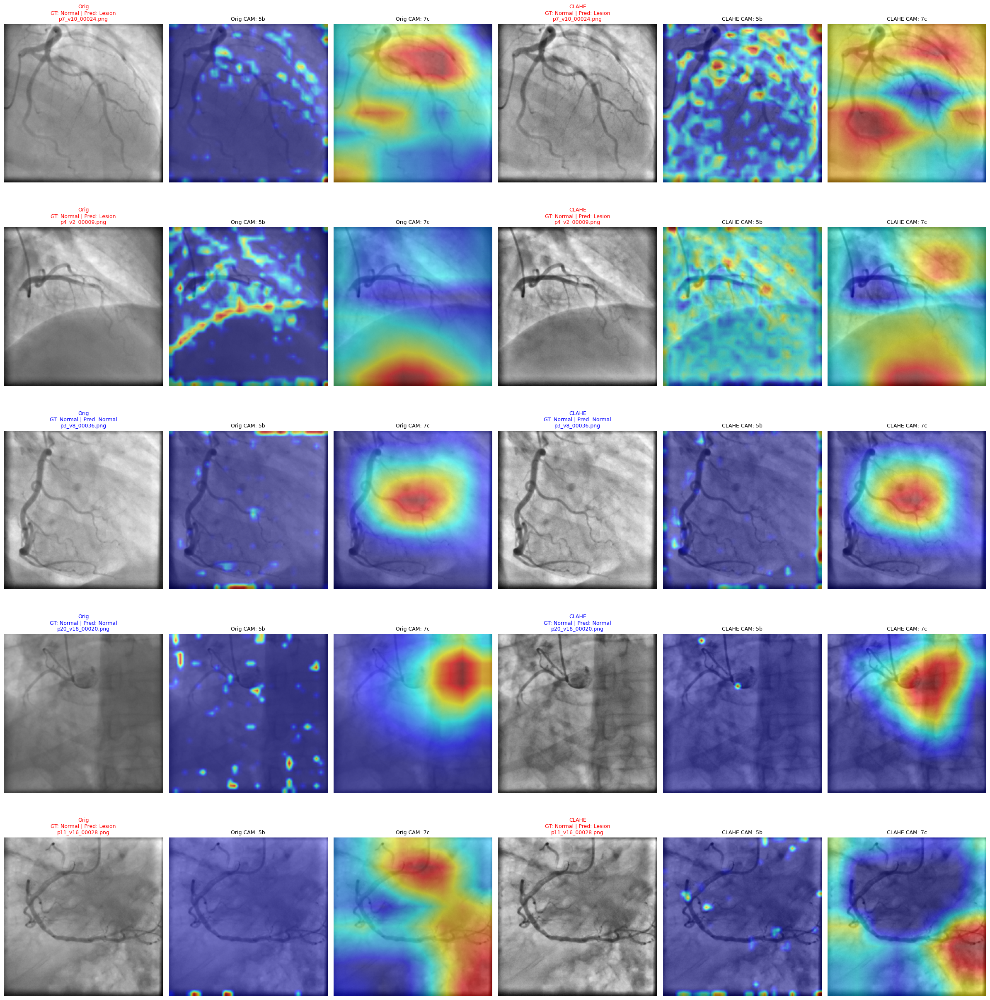

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

def apply_clahe(img_path):
    img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img_clahe = clahe.apply(img)
    return cv2.cvtColor(img_clahe, cv2.COLOR_GRAY2RGB)

num_images = 5
random_samples = cadica_df_for_finetuning.sample(num_images)

fig, axes = plt.subplots(num_images, 6, figsize=(24, 25))
target_layers_list = [model.Mixed_5b, model.Mixed_7c]

for i, (idx, row) in enumerate(random_samples.iterrows()):
    path = row['frame_path']
    file_name = Path(path).name
    true_label = "Lesion" if row['label'] == 1 else "Normal"

    img_orig = Image.open(path).convert('RGB').resize((299, 299))
    img_clahe = Image.fromarray(apply_clahe(path)).resize((299, 299))

    t_orig = my_transform(img_orig).unsqueeze(0).to(device)
    t_clahe = my_transform(img_clahe).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        pred_idx = torch.argmax(model(t_orig), dim=1).item()
        pred_label = "Lesion" if pred_idx == 1 else "Normal"

    images = [img_orig, img_clahe]
    tensors = [t_orig, t_clahe]
    titles = ["Orig", "CLAHE"]

    for k in range(2):
        axes[i, k*3].imshow(images[k])
        title_text = f"{titles[k]}\nGT: {true_label} | Pred: {pred_label}\n{file_name}"
        axes[i, k*3].set_title(title_text, fontsize=9, color="blue" if true_label == pred_label else "red")
        axes[i, k*3].axis('off')

        for j, layer in enumerate(target_layers_list):
            cam = GradCAM(model=model, target_layers=[layer])
            g_cam = cam(input_tensor=tensors[k])[0, :]
            vis = show_cam_on_image(np.array(images[k])/255.0, g_cam, use_rgb=True)

            axes[i, k*3 + j + 1].imshow(vis)
            axes[i, k*3 + j + 1].set_title(f"{titles[k]} CAM: {'5b' if j==0 else '7c'}", fontsize=9)
            axes[i, k*3 + j + 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

def get_performance_report(model, loader):
    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            y_true.extend(labels.numpy())
            y_pred.extend(predicted.cpu().numpy())

    print(classification_report(y_true, y_pred, target_names=['Normal', 'Lesion']))

    plt.figure(figsize=(6, 5))
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Lesion'], yticklabels=['Normal', 'Lesion'])
    plt.title('Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

# 사용법: get_performance_report(model, test_loader)

              precision    recall  f1-score   support

      Normal       1.00      1.00      1.00       321
      Lesion       1.00      1.00      1.00       766

    accuracy                           1.00      1087
   macro avg       1.00      1.00      1.00      1087
weighted avg       1.00      1.00      1.00      1087



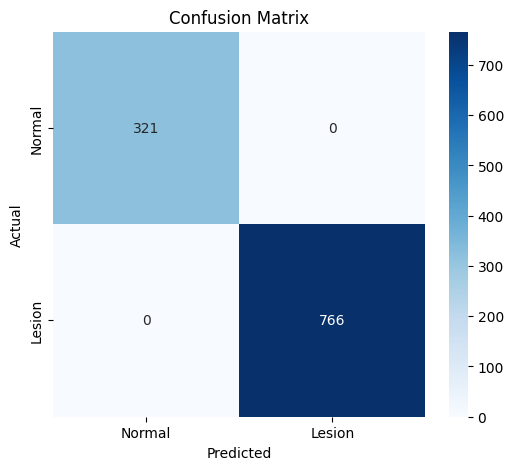

In [ ]:
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
model.eval()

get_performance_report(model, test_loader)